In [1]:
import torch

seed = 0
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if(device == "cuda"):
    torch.cuda.synchronize()
print(device)

cuda


In [2]:
!mkdir models

mkdir: cannot create directory ‘models’: File exists


In [3]:
!mkdir datasets

mkdir: cannot create directory ‘datasets’: File exists


In [4]:
pip install protein_bert_pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
import torch
from protein_bert_pytorch import ProteinBERT, PretrainingWrapper
annotation_max = 1

def proteinBERT_model():
    return ProteinBERT(
      num_tokens = 25,
      num_annotation = annotation_max,
      dim = 512,
      dim_global = 256,
      depth = 6,
      narrow_conv_kernel = 9,
      wide_conv_kernel = 9,
      wide_conv_dilation = 5,
      attn_heads = 8,
      attn_dim_head = 64,
      local_to_global_attn = False,
      local_self_attn = True,
      num_global_tokens = 2,
      glu_conv = False
  )

In [6]:
_acid2int = {'A' : 1,'R' : 2,'N' : 3,'D' : 4,'C' : 5,'Q' : 6,'E' : 7,'G' : 8,'H' : 9,'I' : 10,
          'L' : 11,'K' : 12,'M' : 13,'F' : 14,'P' : 15,'S' : 16,'T' : 17,'W' : 18,'Y' : 19,
          'V' : 20,'B' : 21,'Z' : 22,'X' : 23,'*' : 24,'-' : 25,'?' : 0}

def acid2int(seq : str) -> list:
    return [(_acid2int[i]) for i in seq]

x = 'ABTZX'
acid2int(x) # returns [1, 21, 17, 22, 23]

[1, 21, 17, 22, 23]

In [7]:
dataset = []
import torch
import pickle

def load_unsupervised_dataset():
  with open('datasets/compressed_sps_dataset.pkl', 'rb') as filereader:
    dataset_loaded = pickle.load(filereader)

  for instance in dataset_loaded:
      seq = acid2int(instance[0])
      seq = seq + [0]*(250-len(seq))
      dataset.append([torch.tensor(seq), instance[1]])
      
  print(len(dataset))
load_unsupervised_dataset()

191734


In [8]:
# fill up the selected sequences to equal length
# split into train and test-set
batch_size=64

from torch.utils.data import DataLoader, random_split

# test_size = int(0.0 * len(dataset))
# train_size = len(dataset) - test_size
# train_set, test_set = random_split(dataset, [train_size, test_size])


pretrain_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Sizes of resulting train and test-set
print(len(pretrain_dataloader))


2996


In [9]:
from protein_bert_pytorch import ProteinBERT, PretrainingWrapper

model = proteinBERT_model()
model.load_state_dict(torch.load('models/pretrained_sps_75.pt'))


model.to(device)
learner = PretrainingWrapper(
    model,
    random_replace_token_prob = 0.05,    # what percentage of the tokens to replace with a random one, defaults to 5% as in paper
    remove_annotation_prob = 0.0,       # what percentage of annotations to remove, defaults to 25%
    add_annotation_prob = 0.00,          # probability to add an annotation randomly, defaults to 1%
    remove_all_annotations_prob = 0.0,   # what percentage of batch items to remove annotations for completely, defaults to 50%
    seq_loss_weight = 1.,                # weight on loss of sequence
    annotation_loss_weight = 0.,         # weight on loss of annotation
    exclude_token_ids = (0, 1, 2)        # for excluding padding, start, and end tokens from being masked
)

In [10]:
annotation_max = 1
print(annotation_max)

1


In [11]:
# do the following in a loop for a lot of sequences and annotations
from tqdm.notebook import tqdm
criterion = torch.nn.MSELoss()

def train_unsupervised(model, dataloader, epochs = 1, lr=0.00001, data_divisor=5, annotations=True):
    for epoch in range(epochs):
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        summed_loss = 0.0
        model.to(device)
        with tqdm(total=len(dataloader)/data_divisor) as pbar:
            for index_data, (inputs,labels) in enumerate(dataloader):
                optimizer.zero_grad()

                if(annotations):
                    annotation = torch.nn.functional.one_hot(labels[0], annotation_max).float().to(device) 
                else:
                    annotation_list = [[0]*annotation_max]*inputs.shape[0]
                    annotation = torch.tensor(annotation_list).float().to(device)
                
                mask       = torch.ones(inputs.shape).bool().to(device)
                # print(mask.shape, annotation.shape,inputs.shape)
                
                loss = learner(inputs.to(device), annotation, mask = mask) # (2, 2048, 21), (2, 8943)
                summed_loss+=loss.detach()
                loss.backward()
                optimizer.step()
                pbar.set_description(f'loss: {"%.5f" % (summed_loss/((index_data+1)*batch_size))}')
                pbar.update(1)
                
                # Only go for about 10% of training data each epoch
                if(index_data>=len(dataloader)/data_divisor):
                    break
        pbar.close()

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_5.pt')

In [ ]:
model.load_state_dict(torch.load('models/pretrained_sps_5.pt'))
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_10.pt')

In [ ]:
model.load_state_dict(torch.load('models/pretrained_sps_10.pt'))
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_15.pt') # 24

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_20.pt') # 22

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_25.pt') # 21

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_30.pt') # 20

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_35.pt') # 19

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_40.pt')

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_45.pt')

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_50.pt')

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=10, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_60.pt')

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=10, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_70.pt')

In [ ]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_75.pt')

In [13]:
train_unsupervised(model, pretrain_dataloader, epochs=5, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_80.pt')

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

In [14]:
train_unsupervised(model, pretrain_dataloader, epochs=10, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_90.pt')

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

In [15]:
train_unsupervised(model, pretrain_dataloader, epochs=10, annotations=False)
torch.save(model.state_dict(), 'models/pretrained_sps_100.pt')

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

  0%|          | 0/599.2 [00:00<?, ?it/s]

###Finetuning / Downstream-task###

In [33]:
import torch

seed = 0
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if(device == "cuda"):
    torch.cuda.synchronize()
print(device)

cuda


In [34]:
!mkdir models

mkdir: cannot create directory ‘models’: File exists


In [35]:
!mkdir datasets

mkdir: cannot create directory ‘datasets’: File exists


### Architecture design ###

In [36]:
pip install protein_bert_pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [37]:
import torch
from protein_bert_pytorch import ProteinBERT, PretrainingWrapper
annotation_max = 1 # 18000  # 2350

def proteinBERT_model():
    return ProteinBERT(
      num_tokens = 25,
      num_annotation = annotation_max,
      dim = 512,
      dim_global = 256,
      depth = 6,
      narrow_conv_kernel = 9,
      wide_conv_kernel = 9,
      wide_conv_dilation = 5,
      attn_heads = 8,
      attn_dim_head = 64,
      local_to_global_attn = False,
      local_self_attn = True,
      num_global_tokens = 2,
      glu_conv = False
  )

In [38]:
import torch.nn as nn

class Identity(nn.Module):
    def __init__(self):
        super(Identity, self).__init__()
        
    def forward(self, x):
        return x

def compactify_model(_model):
    _model.to_token_logits = Identity()
    _model.to_global_emb = Identity()
    _model.to_annotation_logits = Identity()
    seq = torch.randint(0, 21, (2, 250)).to(device)
    mask = torch.ones(2, 250).bool().to(device)
    annotation = torch.randint(0, 1, (2, 512)).float().to(device)
    seq_logits, annotation_logits = _model(seq, annotation, mask = mask)
    print(seq_logits.shape, annotation_logits.shape)
    return _model


In [39]:
dropout1 = 0.075
dropout2 = 0.075
dropout_str = "0075"

class predictorNet(torch.nn.Module):
    def __init__(self, dropout):
        super().__init__()
        self.flatten = torch.nn.Flatten(start_dim=1)
        self.linear1 = torch.nn.Linear(179200, 64)
        self.linear2 = torch.nn.Linear(64, 32)
        self.linear3 = torch.nn.Linear(32, 2)
        self.dropout = torch.nn.Dropout(p=dropout)
        
    def forward(self, x, dropout=True):
        x = self.flatten(x)
        if(dropout): x = self.dropout(x)
        x = self.linear1(x)
        x = torch.nn.functional.softplus(x)
        if(dropout): x = self.dropout(x)
        x = self.linear2(x)
        x = torch.nn.functional.softplus(x)
        x = self.linear3(x)
        return x

In [40]:
pretrained_str = "sps_50"

# refresh random seed and create model1
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
model_predictor1 = predictorNet(dropout1)
model_predictor1.to(device)


model1 = proteinBERT_model()
model1.load_state_dict(torch.load('models/pretrained_sps_100.pt'))
model1.to(device)
model1 = compactify_model(model1)



# refresh random seed and create model2
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
model_predictor2 = predictorNet(dropout2)
model_predictor2.to(device)

model2 = proteinBERT_model()
# model2.load_state_dict(torch.load('models/pretrained_sps_50.pt'))
# print(model2)
model2.to(device)
model2 = compactify_model(model2)

torch.Size([2, 250, 512]) torch.Size([2, 2, 256])
torch.Size([2, 250, 512]) torch.Size([2, 2, 256])


### Data preparation ###

In [41]:
_acid2int = {'A' : 1,'R' : 2,'N' : 3,'D' : 4,'C' : 5,'Q' : 6,'E' : 7,'G' : 8,'H' : 9,'I' : 10,
          'L' : 11,'K' : 12,'M' : 13,'F' : 14,'P' : 15,'S' : 16,'T' : 17,'W' : 18,'Y' : 19,
          'V' : 20,'B' : 21,'Z' : 22,'X' : 23,'*' : 24,'-' : 25,'?' : 0}

def acid2int(seq : str) -> list:
    return [(_acid2int[i]) for i in seq]

x = 'ABTZX'
acid2int(x) # returns [1, 21, 17, 22, 23]

[1, 21, 17, 22, 23]

In [42]:
import json
   
# Configuration
min_seq=25
max_seq=350
    
# Opening JSON file
f = open('datasets/fp_database.json', encoding='UTF-8')
normalizer = [0.002, 0.002, 1, 0.01]

fp_dataset = []
name_list = []
# returns JSON object as 
# a dictionary
data = json.load(f)
# Iterating through the json
# list
print(len(data))
for index, i in enumerate(data):
    try:  # To read incomplete files and make this method more robust
        name=i['name']
        seq=i['seq']
        em=i['states'][0]['em_max']
        ex=i['states'][0]['ex_max']
        qy=i['states'][0]['qy']
        br=i['states'][0]['brightness']
        if(index==0):
            print(name)
            print()
            print(seq)
            print(qy)
            print(br)
            print(em)
            print(ex)
        if(seq!=None) and (em!=None) and (ex!=None): #  and (qy!=None):
            if(len(seq)>min_seq) and (len(seq)<max_seq) and (em>0) and (ex>0):
                seq_ = seq + "".join(["?"]*(max_seq-len(seq)))
                label = torch.tensor([em, ex]).float()
                sequence = torch.tensor(acid2int(seq_))
                fp_dataset.append([sequence, torch.tensor([label[0]*normalizer[0], label[1]*normalizer[1]])])
                name_list.append(name)
    except:
        True
# Closing file
f.close()

print(len(fp_dataset))

797
617


In [43]:
# Only for brightness/qy: negative samples
import pickle

def load_unsupervised_dataset():
  with open('datasets/compressed_sps_dataset.pkl', 'rb') as filereader:
    dataset_loaded = pickle.load(filereader)
  initial_len=len(fp_dataset)
  index=0
  while index < initial_len:
      print("restart")
      for instance in dataset_loaded:
        seq = acid2int(instance[0])
        if(len(seq)>200):
          seq = seq + [0]*(max_seq-len(seq))
          fp_dataset.append([torch.tensor(seq), torch.tensor([0]).float()*normalizer[2]])
          index+=1
          if(index>=initial_len):
            break
      
  print(len(fp_dataset))
# load_unsupervised_dataset()

In [44]:
for element in name_list:
    if("gold" in element.lower()):
        print(element.lower())

mgold
staygold


In [45]:
import pickle
normalizer = [0.002, 0.002, 1, 0.01]
with (open("datasets/test_dataset_split_fp.pkl", "rb")) as openfile:
    [train_set, test_set] = pickle.load(openfile)  
# print(test_set[0])

In [46]:
batch_size=16
train_dataloader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_set, batch_size=batch_size, shuffle=True)

# Sizes of resulting train and test-set
print(len(train_dataloader))
print(len(test_dataloader))

36
4


In [47]:
for index, element in enumerate(test_dataloader):
    print(len(element[0]))

16
16
16
2


### Training process ###

In [48]:
global Epoch, lc_train, lc_test, lc_train2, lc_test2
Epoch = 0
lc_train, lc_test = [], []
lc_train2, lc_test2 = [], []

In [49]:
lr_factor = 1.0
lr_f1 = 2.0
lr_f2 = 2.0

In [50]:
# do the following in a loop for a lot of sequences and annotations
from tqdm.notebook import tqdm
criterion = torch.nn.MSELoss()

# only spectra
def train_supervised(_model, _predictor, dataloader_train, dataloader_test, lr=1, epochs=10, dropout=True, dropout_flipping=False):
    dropout = dropout
    global Epoch
    optimizer = torch.optim.Adam(_model.parameters(),    lr=lr*0.0000001*lr_factor)
    optimizer2 = torch.optim.Adam(_predictor.parameters(), lr=lr*0.0000002*lr_factor)  
    summed_loss = 0.0
    for epoch in range(epochs):
        Epoch+=1
        if(Epoch%10==1):
            print("epoch: " + str(Epoch-1))
        summed_loss = 0.0
        with tqdm(total=len(dataloader_train)) as pbar:
            train_index=0
            # training process
            for index, (inputs,labels) in enumerate(dataloader_train):
                optimizer.zero_grad()
                optimizer2.zero_grad()

                annotation_list = [[0]*512]*inputs.shape[0]
                annotation = torch.tensor(annotation_list).float()
                mask       = torch.ones(inputs.shape).bool()
                
                # print(inputs.shape, annotation.shape, mask.shape)
                representation, annotation_repr = _model(inputs.to(device), annotation.to(device), mask = mask.to(device))
                if(dropout_flipping==True):
                  dropout = not dropout
                x = _predictor(representation, dropout=dropout)
                # print(labels.shape, x.shape)
                # print(inputs)
                loss = criterion(labels.to(device), x.to(device))
                summed_loss+=loss.detach()
                train_index += inputs.shape[0]
                
                loss.backward()
                optimizer.step()
                optimizer2.step()
                pbar.set_description(f'train_loss: {"%.5f" % (summed_loss/train_index*100)}')
                pbar.update(1)
            
            # evaluation process
            test_index = 0
            summed_test_loss = 0
            optimizer.zero_grad()
            optimizer2.zero_grad()   
            for _, (inputs,labels) in enumerate(dataloader_test):
                
                annotation_list = [[0]*512]*inputs.shape[0]
                annotation = torch.tensor(annotation_list).float()
                mask       = torch.ones(inputs.shape).bool()
                representation, annotation_repr = _model(inputs.to(device), annotation.to(device), mask = mask.to(device))
                x = _predictor(representation, dropout=False)
                loss = criterion(labels.to(device), x.to(device))
                test_index += inputs.shape[0]
                summed_test_loss+=loss.detach()
            
            lc_train.append(summed_loss/train_index) 
            lc_test.append(summed_test_loss/test_index)    
            pbar.set_description(f'train_loss: {"%.5f" % (summed_loss/train_index*100)}, test_loss: {"%.5f" % (summed_test_loss/test_index*100)}')
            pbar.close()


In [51]:
def train_both(epoch_number, model1, model_predictor1, model2, model_predictor2, dropout_flipping=False):
  global Epoch, lc_train, lc_test, lc_train2, lc_test2
  train_supervised(model1, model_predictor1, train_dataloader, test_dataloader,  lr=0.1*lr_f1,  epochs=epoch_number, dropout_flipping=dropout_flipping)  # lr=0.1
  Epoch-=epoch_number
  train_supervised(model2, model_predictor2, train_dataloader, test_dataloader,  lr=0.1*lr_f2,  epochs=epoch_number, dropout_flipping=dropout_flipping)
  lc_train, lc_train2 = lc_train[:Epoch],lc_train2 + lc_train[Epoch:]
  lc_test, lc_test2 = lc_test[:Epoch],lc_test2 + lc_test[Epoch:]

train_both(50, model1, model_predictor1, model2, model_predictor2)

epoch: 0


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 10


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 20


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 30


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 40


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 0


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 10


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 20


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 30


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 40


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

In [52]:
def print_test_instances(dataloader, model, model_predictor):
  for index, (inputs,labels) in enumerate(dataloader): 
      annotation_list = [[0]*512]*inputs.shape[0]
      annotation = torch.tensor(annotation_list).float()
      mask       = torch.ones(inputs.shape).bool()
      token, annotation_logits = model(inputs.to(device), annotation.to(device), mask = mask.to(device))
      x = model_predictor(token, dropout=False)
      loss = criterion(labels.to(device), x.to(device))
      value_list = []
      for index in range(inputs.shape[0]):
          value_list.append([round((labels[index].cpu().detach().numpy()/normalizer[0])[0],3), 
                             round((x[index].cpu().detach().numpy()/normalizer[0])[0],3)])  # :2]) # , loss)
          if(index>5):
            break
      print(value_list)
      break

print("train_data")
print_test_instances(train_dataloader, model1, model_predictor1)
print("test_data")
print_test_instances(test_dataloader, model1, model_predictor1)
print("train_data_pretrained")
print_test_instances(train_dataloader, model2, model_predictor2)
print("test_data_pretrained")
print_test_instances(test_dataloader, model2, model_predictor2)

train_data
[[573.0, 520.399], [448.0, 495.457], [512.0, 468.594], [506.0, 564.66], [450.0, 495.962], [524.0, 495.683], [527.0, 415.739]]
test_data
[[528.0, 506.249], [500.0, 566.216], [516.0, 503.596], [666.0, 504.779], [713.0, 473.338], [589.0, 581.266], [509.0, 513.352]]
train_data_pretrained
[[595.0, 570.955], [492.0, 560.199], [519.0, 525.107], [508.0, 528.763], [515.0, 545.42], [450.0, 517.541], [506.0, 542.715]]
test_data_pretrained
[[633.0, 580.902], [446.0, 493.328], [663.0, 573.17], [630.0, 590.163], [589.0, 574.277], [485.0, 522.007], [659.0, 589.666]]


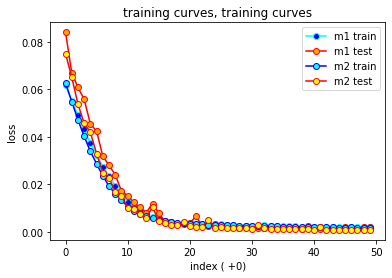

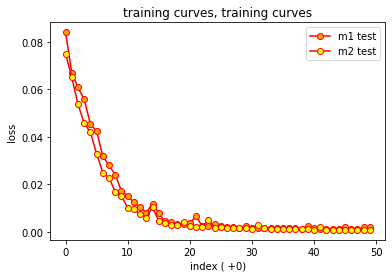

In [53]:
import matplotlib.pyplot as plt
from bokeh.io import show
from bokeh.layouts import row

def plot_learning_courve(l_train=lc_train, l_test=lc_test, l2_train=None, l2_test=None, start_index=0, name="", display=[1,1,1,1]):
  if(display[0]==1):
    plot_data = [] 
    for point in l_train: plot_data.append(point.cpu())
    plt.plot(plot_data[start_index:], color='cyan', marker='o',mfc='blue' )
  if(display[1]==1):
    plot_data = [] 
    for point in l_test: plot_data.append(point.cpu())
    plt.plot(plot_data[start_index:], color='red', marker='o',mfc='orange' )
  if(display[2]==1):
    if(l2_train!=None):
      plot_data = [] 
      for point in l2_train: plot_data.append(point.cpu())
      plt.plot(plot_data[start_index:], color='blue', marker='o',mfc='cyan' )  
  if(display[3]==1):  
    if(l2_test!=None):
      plot_data = [] 
      for point in l2_test: plot_data.append(point.cpu())
      plt.plot(plot_data[start_index:], color='red', marker='o',mfc='yellow' ) 

  plt.ylabel('loss') #set the label for y axis
  plt.xlabel('index ( +' + str(start_index) + ')') #set the label for x-axis
  if(len(name)>1):
    name = ", " + name
  plt.title("training curves" + name) #set the title of the graph
  legend_elements = []
  if(display[0]==1): legend_elements.append('m1 train')
  if(display[1]==1): legend_elements.append('m1 test')
  if(display[2]==1): legend_elements.append('m2 train')
  if(display[3]==1): legend_elements.append('m2 test')
  plt.legend(legend_elements)
  plt.show()

plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 0, "training curves", display=[1,1,1,1])
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 0, "training curves", display=[0,1,0,1])

In [54]:
train_both(100, model1, model_predictor1, model2, model_predictor2)

epoch: 50


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 60


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 70


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 80


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 90


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 100


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 110


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 120


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 130


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 140


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 50


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 60


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 70


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 80


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 90


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 100


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 110


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 120


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 130


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 140


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

train_data
[[512.0, 495.502], [500.0, 523.137], [510.0, 497.89], [514.0, 486.379], [709.0, 700.178], [450.0, 491.105], [504.0, 523.826]]
test_data
[[506.0, 488.06], [500.0, 540.786], [630.0, 616.309], [512.0, 522.15], [527.0, 510.026], [509.0, 490.778], [516.0, 512.077]]
train_data_pretrained
[[506.0, 500.121], [610.0, 599.362], [499.0, 521.197], [483.0, 552.869], [492.0, 501.424], [675.0, 550.197], [447.0, 494.469]]
test_data_pretrained
[[516.0, 561.31], [659.0, 625.887], [475.0, 482.839], [663.0, 604.446], [503.0, 499.827], [666.0, 509.199], [506.0, 494.959]]


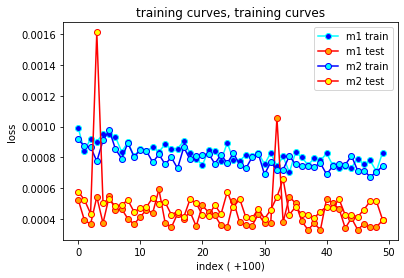

In [55]:
print("train_data")
print_test_instances(train_dataloader, model1, model_predictor1)
print("test_data")
print_test_instances(test_dataloader, model1, model_predictor1)
print("train_data_pretrained")
print_test_instances(train_dataloader, model2, model_predictor2)
print("test_data_pretrained")
print_test_instances(test_dataloader, model2, model_predictor2)
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 100, "training curves")

In [56]:
train_both(100, model1, model_predictor1, model2, model_predictor2)

epoch: 150


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 160


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 170


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 180


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 190


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 200


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 210


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 220


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 230


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 240


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 150


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 160


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 170


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 180


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 190


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 200


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 210


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 220


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 230


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 240


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

train_data
[[637.0, 597.683], [510.0, 501.502], [515.0, 496.06], [521.0, 538.933], [595.0, 583.619], [592.0, 544.797], [518.0, 516.022]]
test_data
[[682.0, 687.904], [495.0, 498.511], [530.0, 500.341], [516.0, 512.785], [506.0, 485.481], [580.0, 541.082], [713.0, 687.523]]
train_data_pretrained
[[555.0, 565.684], [596.0, 569.993], [511.0, 494.069], [512.0, 548.691], [499.0, 499.987], [514.0, 497.359], [578.0, 604.373]]
test_data_pretrained
[[578.0, 525.369], [630.0, 622.842], [585.0, 611.251], [596.0, 585.852], [527.0, 494.781], [633.0, 580.822], [512.0, 519.573]]


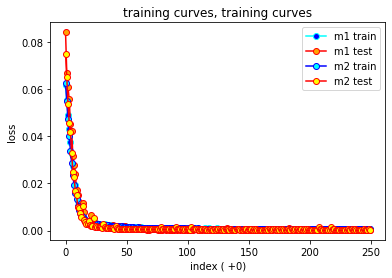

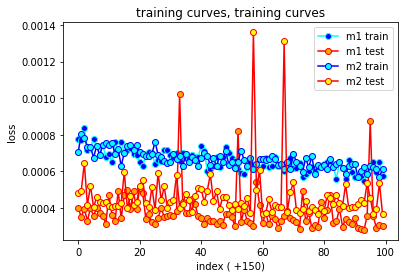

In [57]:
print("train_data")
print_test_instances(train_dataloader, model1, model_predictor1)
print("test_data")
print_test_instances(test_dataloader, model1, model_predictor1)
print("train_data_pretrained")
print_test_instances(train_dataloader, model2, model_predictor2)
print("test_data_pretrained")
print_test_instances(test_dataloader, model2, model_predictor2)
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 0, "training curves")
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 150, "training curves")

In [58]:
torch.save(model1.state_dict(), 'models/pretrained_drp_'+dropout_str+'_m_ex_em_1A.pt')
torch.save(model_predictor1.state_dict(), 'models/pretrained_drp_'+dropout_str+'_b_ex_em_1A.pt')
torch.save(model2.state_dict(), 'models/pretrained_drp_'+dropout_str+'_m_ex_em_1B.pt')
torch.save(model_predictor2.state_dict(), 'models/pretrained_drp_'+dropout_str+'_b_ex_em_1B.pt')

In [59]:
train_both(250, model1, model_predictor1, model2, model_predictor2, dropout_flipping=True)

epoch: 250


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 260


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 270


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 280


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 290


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 300


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 310


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 320


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 330


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 340


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 350


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 360


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 370


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 380


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 390


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 400


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 410


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 420


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 430


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 440


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 450


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 460


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 470


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 480


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 490


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 250


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 260


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 270


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 280


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 290


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 300


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 310


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 320


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 330


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 340


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 350


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 360


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 370


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 380


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 390


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 400


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 410


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 420


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 430


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 440


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 450


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 460


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 470


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 480


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 490


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

train_data
[[490.0, 506.207], [506.0, 491.735], [468.0, 486.444], [524.0, 540.456], [508.0, 520.915], [515.0, 513.429], [595.0, 600.567]]
test_data
[[495.0, 501.223], [713.0, 699.424], [475.0, 484.97], [516.0, 518.148], [485.0, 505.739], [527.0, 528.043], [578.0, 528.887]]
train_data_pretrained
[[500.0, 497.572], [610.0, 559.856], [509.0, 504.269], [504.0, 511.365], [503.0, 491.179], [633.0, 613.463], [512.0, 510.158]]
test_data_pretrained
[[589.0, 599.41], [495.0, 489.92], [643.0, 648.081], [509.0, 516.804], [596.0, 582.791], [516.0, 497.392], [512.0, 514.295]]


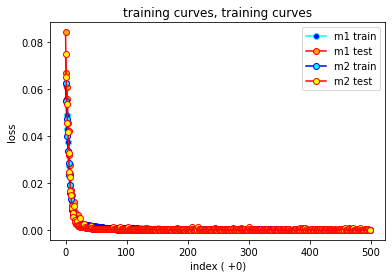

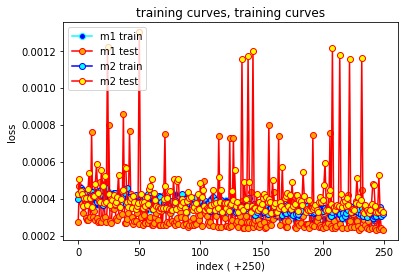

In [60]:
print("train_data")
print_test_instances(train_dataloader, model1, model_predictor1)
print("test_data")
print_test_instances(test_dataloader, model1, model_predictor1)
print("train_data_pretrained")
print_test_instances(train_dataloader, model2, model_predictor2)
print("test_data_pretrained")
print_test_instances(test_dataloader, model2, model_predictor2)
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 0, "training curves")
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 250, "training curves")

In [61]:
train_both(100, model1, model_predictor1, model2, model_predictor2)

epoch: 500


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 510


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 520


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 530


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 540


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 550


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 560


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 570


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 580


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 590


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 500


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 510


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 520


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 530


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 540


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 550


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 560


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 570


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 580


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

epoch: 590


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

train_data
[[477.0, 488.755], [512.0, 517.813], [528.0, 523.92], [720.0, 701.688], [512.0, 514.72], [600.0, 604.304], [511.0, 487.515]]
test_data
[[527.0, 520.935], [506.0, 482.428], [475.0, 479.402], [503.0, 499.496], [513.0, 504.481], [618.0, 620.93], [633.0, 606.056]]
train_data_pretrained
[[424.0, 481.148], [506.0, 488.268], [510.0, 507.796], [501.0, 497.863], [504.0, 505.484], [502.0, 487.906], [503.0, 503.517]]
test_data_pretrained
[[512.0, 517.022], [479.0, 502.176], [633.0, 594.221], [651.0, 642.449], [596.0, 579.331], [509.0, 488.267], [500.0, 519.876]]


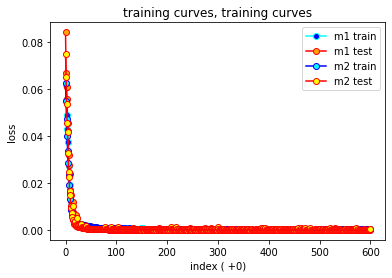

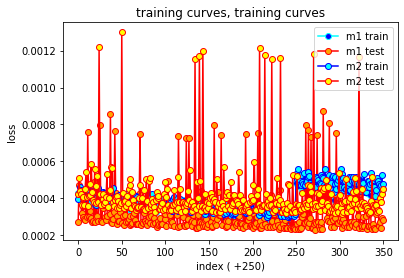

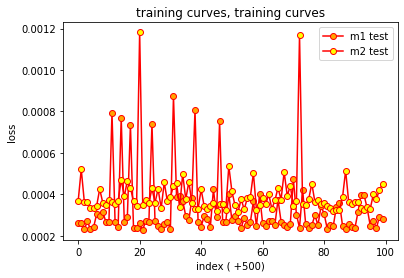

In [62]:
print("train_data")
print_test_instances(train_dataloader, model1, model_predictor1)
print("test_data")
print_test_instances(test_dataloader, model1, model_predictor1)
print("train_data_pretrained")
print_test_instances(train_dataloader, model2, model_predictor2)
print("test_data_pretrained")
print_test_instances(test_dataloader, model2, model_predictor2)
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 0, "training curves")
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 250, "training curves")
plot_learning_courve(lc_train, lc_test, lc_train2, lc_test2, 500, "training curves", display=[0,1,0,1])

In [63]:
import pickle


plot_data_train = [] 
for point in lc_train: plot_data_train.append(point.cpu())
plot_data_test = [] 
for point in lc_test: plot_data_test.append(point.cpu())
plot_data_train2 = [] 
for point in lc_train2: plot_data_train2.append(point.cpu())
plot_data_test2 = [] 
for point in lc_test2: plot_data_test2.append(point.cpu())


with open('datasets/pretrained_dropout_training_courves_fp.pkl', 'wb') as pickle_file:
    pickle.dump([plot_data_train, plot_data_test, plot_data_train2, plot_data_test2], pickle_file, protocol=4)

In [64]:
with open('datasets/test_dataset_split_fp.pkl', 'wb') as pickle_file:
    pickle.dump([train_set, test_set], pickle_file, protocol=4)

In [65]:
torch.save(model1.state_dict(), 'models/pretrained_drp_'+dropout_str+'_m_ex_em_2A.pt')
torch.save(model_predictor1.state_dict(), 'models/pretrained_drp_'+dropout_str+'_b_ex_em_2A.pt')
torch.save(model2.state_dict(), 'models/pretrained_drp_'+dropout_str+'_m_ex_em_2B.pt')
torch.save(model_predictor2.state_dict(), 'models/pretrained_drp_'+dropout_str+'_b_ex_em_2B.pt')